##Phase 1: Set-up

In [42]:
!pip install minisom
!pip install pandas-profiling


In [43]:
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
from sklearn.cluster import KMeans
from sklearn.ensemble import StackingClassifier
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from sklearn.ensemble import RandomForestClassifier
from pandas_profiling import ProfileReport
from keras.utils import to_categorical
from IPython.display import display


##Phase 2:Data pre-processing

In [44]:
training_data=pd.read_csv('training_dataset.csv')
test_data=pd.read_csv('test_dataset.csv')
validation_data=pd.read_csv('validation_dataset.csv')

In [45]:
training_data.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,8192,2976,85,23,95,72,2436,246,193,64,...,0,0,0,0,0,0,0,0,0,1
1,14089,3104,233,12,150,40,1503,200,251,186,...,0,0,0,0,0,0,0,0,0,1
2,10246,3385,160,7,937,204,1224,228,242,147,...,0,0,0,0,0,0,0,0,0,1
3,8686,3191,41,14,210,37,3207,221,208,119,...,1,0,0,0,0,0,0,0,0,1
4,9242,2821,297,4,85,1,992,208,238,169,...,0,0,0,0,0,0,0,0,0,1


In [46]:
training_data.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.00000,...,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000,8286.000000
mean,7609.998431,2732.983104,155.366643,16.868694,225.249698,53.233888,1629.840574,213.732682,218.534999,133.00712,...,0.035723,0.031620,0.001328,0.008810,0.000845,0.003259,0.063481,0.056119,0.040068,4.561550
std,4291.741503,432.906958,108.392758,8.514811,213.670866,62.890107,1259.714393,30.675904,23.142959,46.73019,...,0.185610,0.174996,0.036413,0.093453,0.029055,0.056994,0.243840,0.230165,0.196130,1.789533
min,1.000000,1863.000000,0.000000,0.000000,0.000000,-134.000000,0.000000,58.000000,99.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3889.500000,2350.000000,66.000000,10.000000,60.000000,5.000000,726.000000,197.000000,206.000000,103.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
50%,7479.500000,2720.500000,125.000000,16.000000,175.000000,34.000000,1273.000000,221.000000,222.000000,136.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
75%,11349.750000,3099.750000,252.000000,23.000000,323.000000,84.000000,2155.000000,237.000000,235.000000,166.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.000000,3849.000000,360.000000,50.000000,1343.000000,547.000000,6508.000000,254.000000,254.000000,248.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [47]:
# Get all the column names
column_names = training_data.columns.tolist()
# Print the column names
print(column_names)


['Id', 'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40', 'Cover_Type']


In [48]:
from pandas_profiling import ProfileReport

# Assuming you have loaded your dataset into a DataFrame called 'df'

# Generate the profile report
profile = ProfileReport(training_data, title='Pandas Profile Report', explorative=True)
display(profile)



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [49]:

# Identify outliers in the numerical features
outliers = {}
for column in training_data.columns:
    if training_data[column].dtype in [int, float]:  # Check if the column is numerical
        Q1 = training_data[column].quantile(0.25)
        Q3 = training_data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = training_data[(training_data[column] < lower_bound) | (training_data[column] > upper_bound)].shape[0]

print("Number of Outliers in Numerical Features:")
print(outliers)


Number of Outliers in Numerical Features:
{'Id': 0, 'Elevation': 0, 'Aspect': 0, 'Slope': 20, 'Horizontal_Distance_To_Hydrology': 294, 'Vertical_Distance_To_Hydrology': 276, 'Horizontal_Distance_To_Roadways': 459, 'Hillshade_9am': 209, 'Hillshade_Noon': 191, 'Hillshade_3pm': 59, 'Horizontal_Distance_To_Fire_Points': 352, 'Wilderness_Area1': 1711, 'Wilderness_Area2': 253, 'Wilderness_Area3': 0, 'Wilderness_Area4': 0, 'Soil_Type1': 207, 'Soil_Type2': 378, 'Soil_Type3': 579, 'Soil_Type4': 518, 'Soil_Type5': 96, 'Soil_Type6': 400, 'Soil_Type7': 0, 'Soil_Type8': 1, 'Soil_Type9': 5, 'Soil_Type10': 1209, 'Soil_Type11': 248, 'Soil_Type12': 75, 'Soil_Type13': 296, 'Soil_Type14': 86, 'Soil_Type15': 0, 'Soil_Type16': 64, 'Soil_Type17': 369, 'Soil_Type18': 36, 'Soil_Type19': 19, 'Soil_Type20': 57, 'Soil_Type21': 5, 'Soil_Type22': 80, 'Soil_Type23': 285, 'Soil_Type24': 92, 'Soil_Type25': 1, 'Soil_Type26': 27, 'Soil_Type27': 5, 'Soil_Type28': 5, 'Soil_Type29': 561, 'Soil_Type30': 445, 'Soil_Type31':

In [50]:

# Selecting a subset of columns for visualization
selected_columns = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
                    'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
                    'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
                    'Cover_Type']

# Create a DataFrame with only the selected columns
selected_df = training_data[selected_columns]

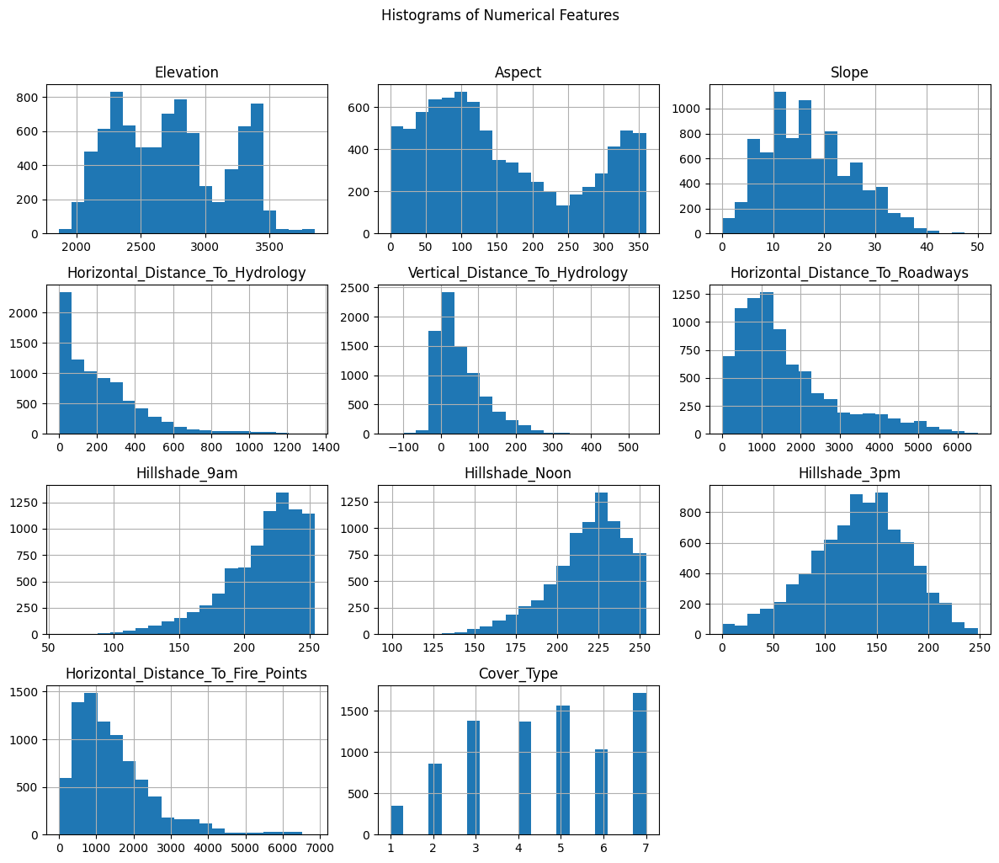

In [51]:
# Histograms: Visualize the distribution of numerical features
numerical_features = selected_df.select_dtypes(include=['int64', 'float64']).columns
selected_df[numerical_features].hist(figsize=(12, 10), bins=20)
plt.suptitle("Histograms of Numerical Features", y=1.02)
plt.tight_layout()
plt.show()

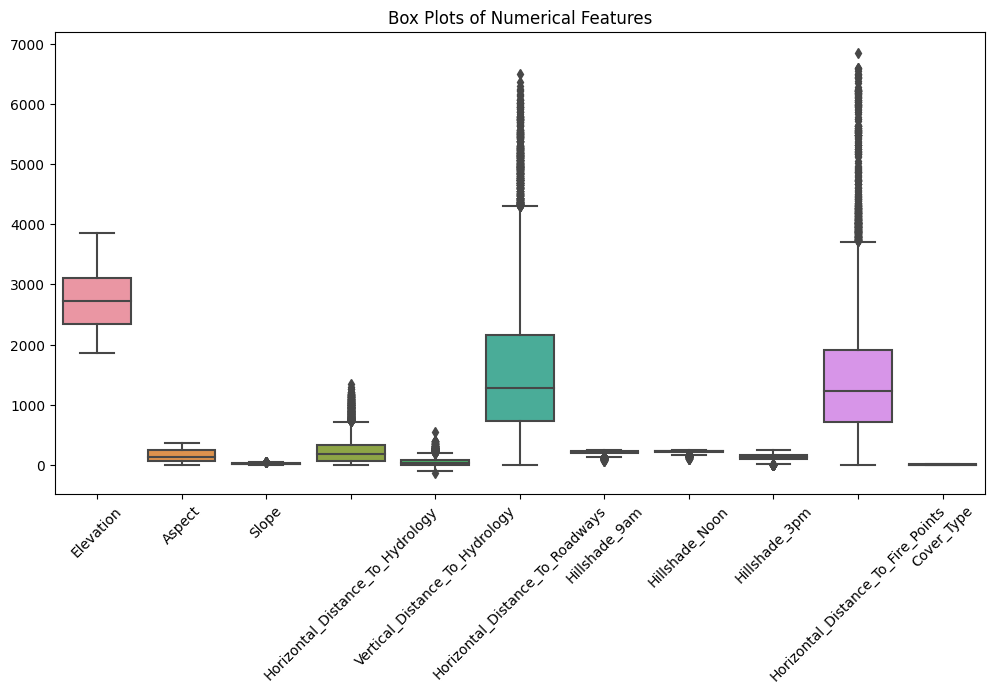

In [52]:
# Box Plots: Check for outliers and understand the spread of numerical features
plt.figure(figsize=(12, 6))
sns.boxplot(data=selected_df[numerical_features])
plt.title("Box Plots of Numerical Features")
plt.xticks(rotation=45)
plt.show()

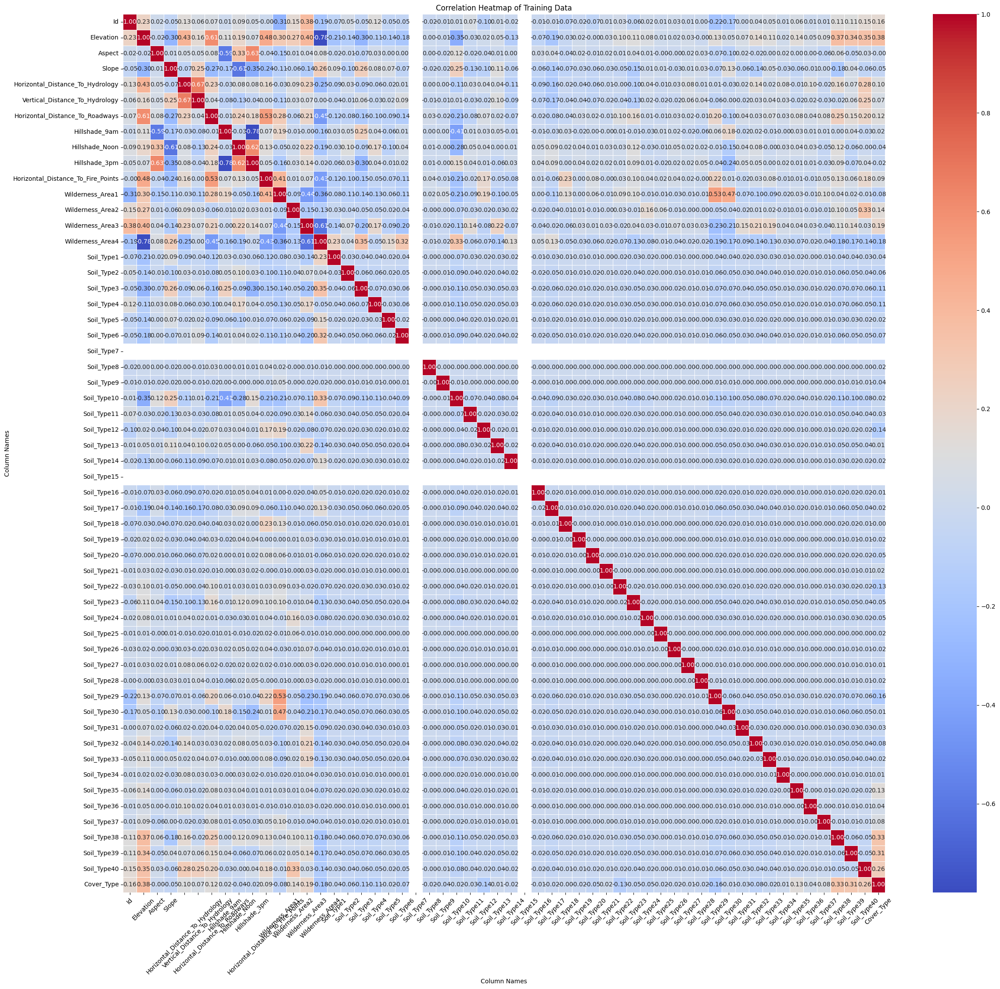

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'training_data' is your DataFrame
correlation_matrix = training_data.corr()

# Modify the heatmap
plt.figure(figsize=(28, 26))  # Adjust the figure size to your preference

# Customize the color map
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add labels and a title
plt.xlabel('Column Names')
plt.ylabel('Column Names')
plt.title('Correlation Heatmap of Training Data')

# Rotate the axis labels for better readability
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Show the modified heatmap
plt.show()


In [54]:
training_data.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0


In [55]:
training_data.duplicated().sum()

0

In [56]:
training_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8286 entries, 0 to 8285
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  8286 non-null   int64
 1   Elevation                           8286 non-null   int64
 2   Aspect                              8286 non-null   int64
 3   Slope                               8286 non-null   int64
 4   Horizontal_Distance_To_Hydrology    8286 non-null   int64
 5   Vertical_Distance_To_Hydrology      8286 non-null   int64
 6   Horizontal_Distance_To_Roadways     8286 non-null   int64
 7   Hillshade_9am                       8286 non-null   int64
 8   Hillshade_Noon                      8286 non-null   int64
 9   Hillshade_3pm                       8286 non-null   int64
 10  Horizontal_Distance_To_Fire_Points  8286 non-null   int64
 11  Wilderness_Area1                    8286 non-null   int64
 12  Wilder

In [57]:
training_data.drop("Id", axis=1, inplace=True)
test_data.drop("Id", axis=1, inplace=True)
validation_data.drop("Id", axis=1, inplace=True)



In [58]:
training_data.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2976,85,23,95,72,2436,246,193,64,836,...,0,0,0,0,0,0,0,0,0,1
1,3104,233,12,150,40,1503,200,251,186,1129,...,0,0,0,0,0,0,0,0,0,1
2,3385,160,7,937,204,1224,228,242,147,752,...,0,0,0,0,0,0,0,0,0,1
3,3191,41,14,210,37,3207,221,208,119,865,...,1,0,0,0,0,0,0,0,0,1
4,2821,297,4,85,1,992,208,238,169,242,...,0,0,0,0,0,0,0,0,0,1


##*MODELING*

In [94]:
# Separate features and target variable (Cover_Type) for training data
X_train = training_data.drop("Cover_Type", axis=1)
y_train = training_data["Cover_Type"]
# Separate features and target variable (Cover_Type) for test data
X_test = test_data.drop("Cover_Type", axis=1)
y_test = test_data["Cover_Type"]
# Separate features and target variable (Cover_Type) for validation data
X_validation = validation_data.drop("Cover_Type", axis=1)
y_validation = validation_data["Cover_Type"]

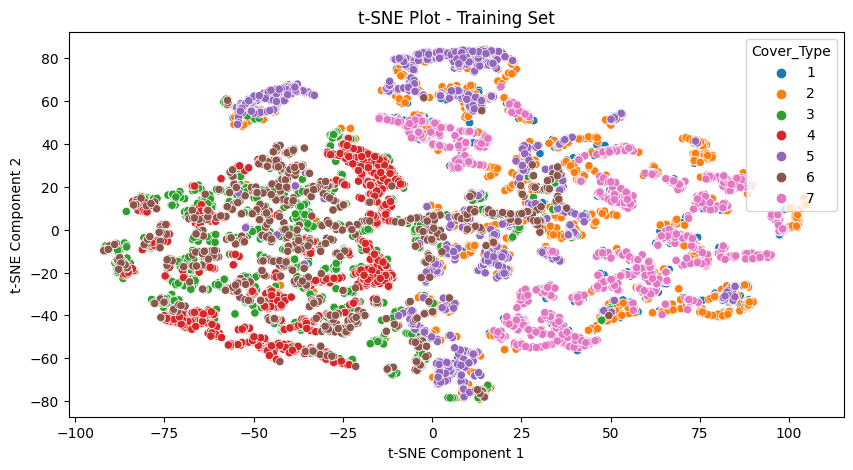

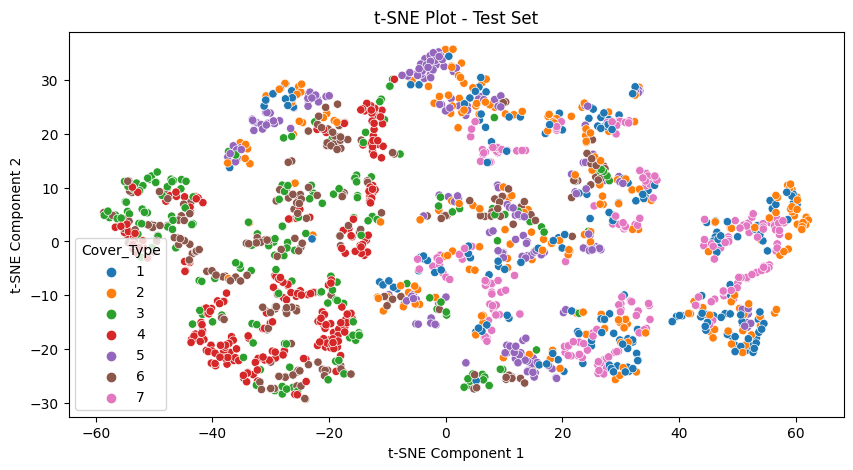

In [60]:
# Perform t-SNE to reduce dimensionality to 2D for training data
tsne_train = TSNE(n_components=2, random_state=42)
X_train_tsne = tsne_train.fit_transform(X_train)

# Perform t-SNE to reduce dimensionality to 2D for test data
tsne_test = TSNE(n_components=2, random_state=42)
X_test_tsne = tsne_test.fit_transform(X_test)

# Create scatter plot for training data
plt.figure(figsize=(10, 5))
sns.scatterplot(x=X_train_tsne[:, 0], y=X_train_tsne[:, 1], hue=y_train, palette="tab10", legend="full")
plt.title("t-SNE Plot - Training Set")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()

# Create scatter plot for test data
plt.figure(figsize=(10, 5))
sns.scatterplot(x=X_test_tsne[:, 0], y=X_test_tsne[:, 1], hue=y_test, palette="tab10", legend="full")
plt.title("t-SNE Plot - Test Set")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


###Q1

In [118]:
def train_evaluate_model(model, model_name, X_train, y_train, X_test, y_test, X_validation, y_validation):
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    y_validation_pred = model.predict(X_validation)

    # Calculate training, testing, and validation accuracy
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    validation_accuracy = accuracy_score(y_validation, y_validation_pred)

    # Print accuracy values
    print(f'Training Accuracy for {model_name}: {train_accuracy:.4f}')
    print(f'Testing Accuracy for {model_name}: {test_accuracy:.4f}')
    print(f'Validation Accuracy for {model_name}: {validation_accuracy:.4f}')

    # Plot confusion matrix using seaborn for the testing set
    cm = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True,
                xticklabels=np.arange(1, 8), yticklabels=np.arange(1, 8))
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    return test_accuracy, validation_accuracy

Training Accuracy for KNN: 0.8853
Testing Accuracy for KNN: 0.7384
Validation Accuracy for KNN: 0.7523


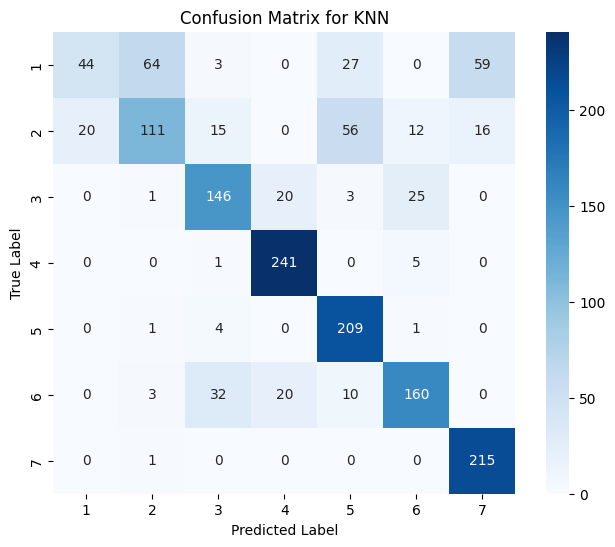

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training Accuracy for Logistic Regression: 0.5782
Testing Accuracy for Logistic Regression: 0.4741
Validation Accuracy for Logistic Regression: 0.4773


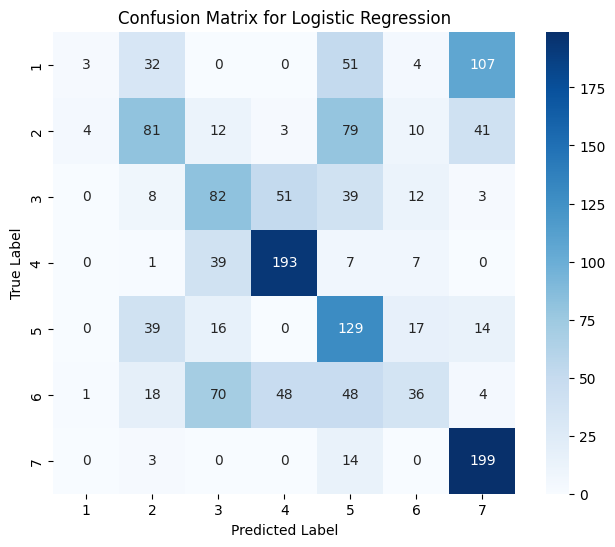

Training Accuracy for SVM: 0.6859
Testing Accuracy for SVM: 0.5613
Validation Accuracy for SVM: 0.5501


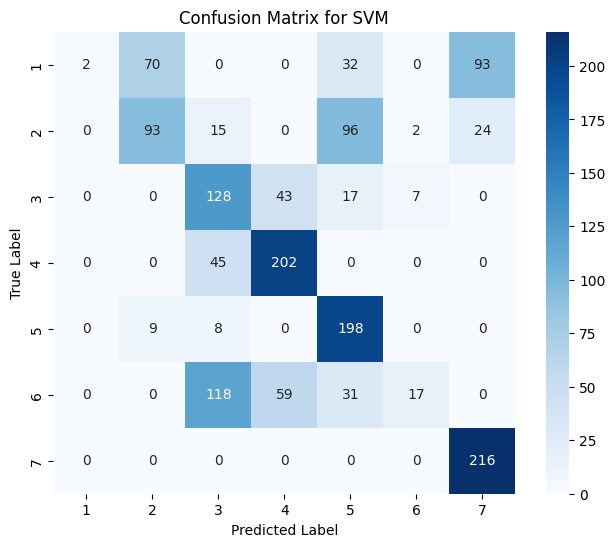

Training Accuracy for Decision Tree: 1.0000
Testing Accuracy for Decision Tree: 0.7600
Validation Accuracy for Decision Tree: 0.7583


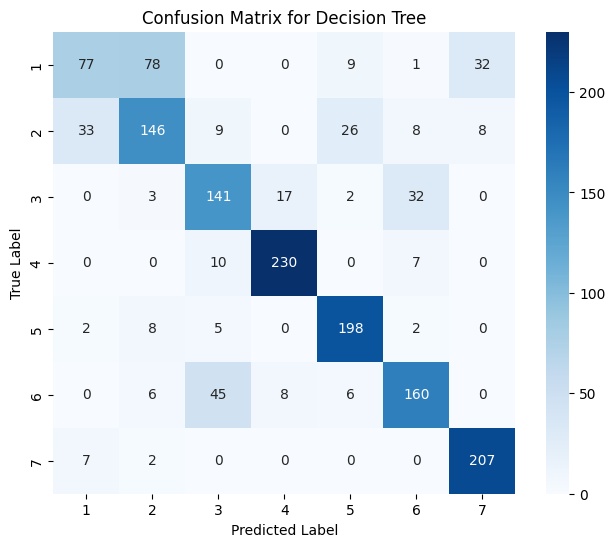

Training Accuracy for Naive Bayes: 0.6417
Testing Accuracy for Naive Bayes: 0.6013
Validation Accuracy for Naive Bayes: 0.5995


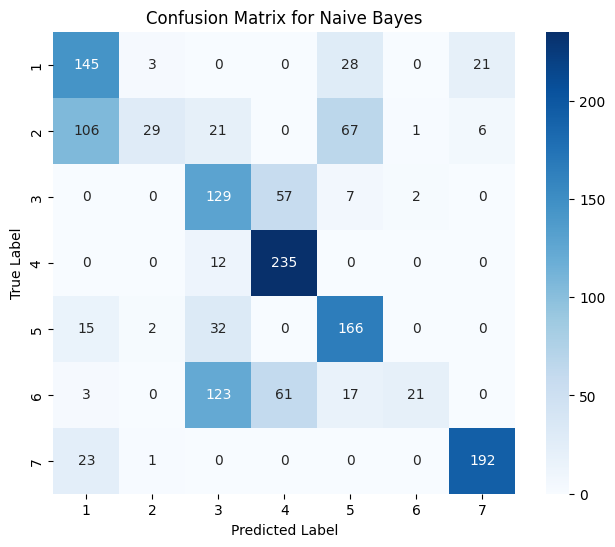

In [119]:
# Initialize the ML models
models = {
    'KNN': KNeighborsClassifier(),
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'Naive Bayes': GaussianNB()
}

baseline_results = {}
validation_results = {}

for model_name, model in models.items():
    test_accuracy, validation_accuracy = train_evaluate_model(model, model_name, X_train, y_train, X_test, y_test, X_validation, y_validation)
    baseline_results[model_name] = test_accuracy
    validation_results[model_name] = validation_accuracy

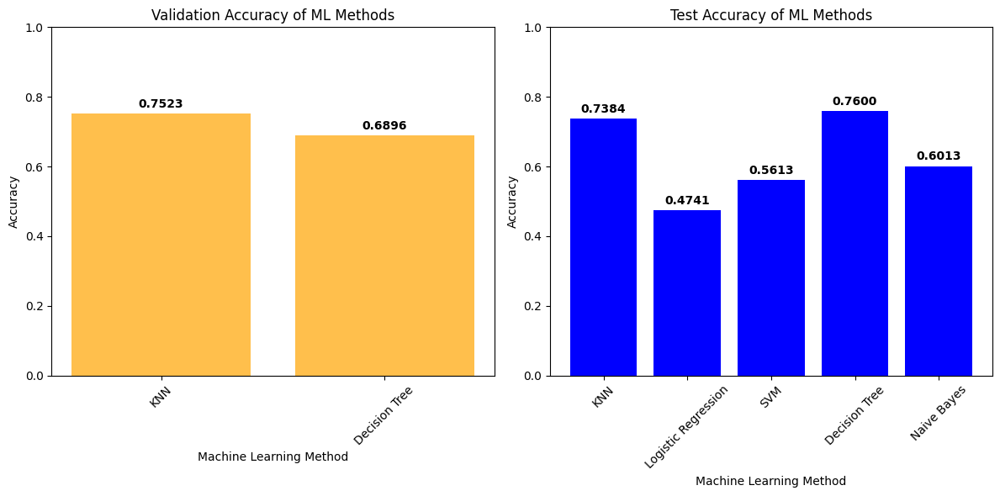

In [128]:
plt.figure(figsize=(12, 6))

# Plot for validation accuracy
plt.subplot(1, 2, 1)
bar1 = plt.bar(validation_results.keys(), validation_results.values(), alpha=0.7, color='orange')
plt.title('Validation Accuracy of ML Methods')
plt.xlabel('Machine Learning Method')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.xticks(rotation=45)

# Show the validation accuracy numbers on top of the bars
for bar, val in zip(bar1, validation_results.values()):
    plt.text(bar.get_x() + bar.get_width() / 2, val + 0.01, f'{val:.4f}', ha='center', va='bottom', fontweight='bold')

# Plot for test accuracy
plt.subplot(1, 2, 2)
bar2 = plt.bar(baseline_results.keys(), baseline_results.values(), color='blue')
plt.title('Test Accuracy of ML Methods')
plt.xlabel('Machine Learning Method')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.xticks(rotation=45)

# Show the test accuracy numbers on top of the bars
for bar, val in zip(bar2, baseline_results.values()):
    plt.text(bar.get_x() + bar.get_width() / 2, val + 0.01, f'{val:.4f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()


In [121]:
baseline_results.values()

dict_values([0.7383606557377049, 0.4740983606557377, 0.5613114754098361, 0.76, 0.6013114754098361])

In [122]:

# Print the baseline performance for each model
print("Baseline Performance for Each Model:")
for model_name, test_accuracy in sorted_results.items():
    print(f"{model_name}: Test Accuracy = {test_accuracy:.4f}")

# Get the names of the top two models
best_models = list(sorted_results.keys())[:2]

# Print the best two models
print(f"\nThe best two models based on test accuracy are: {best_models[0]} and {best_models[1]}")


Baseline Performance for Each Model:
Decision Tree: Test Accuracy = 0.7626
KNN: Test Accuracy = 0.7384
Naive Bayes: Test Accuracy = 0.6013
SVM: Test Accuracy = 0.5613
Logistic Regression: Test Accuracy = 0.4741

The best two models based on test accuracy are: Decision Tree and KNN


Q2

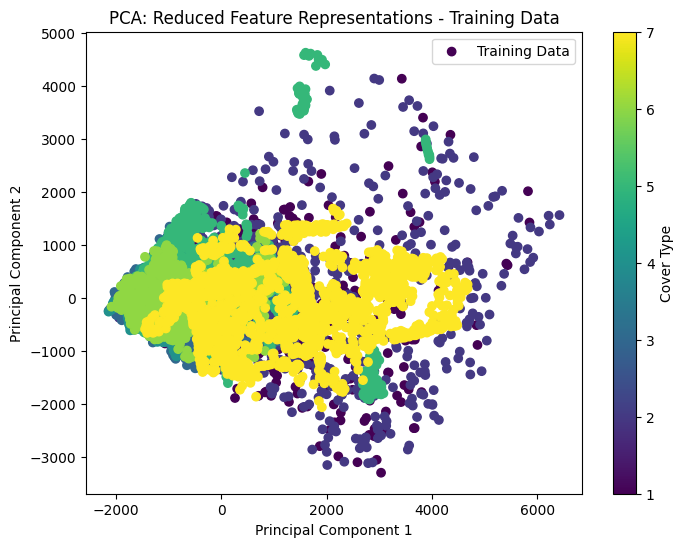

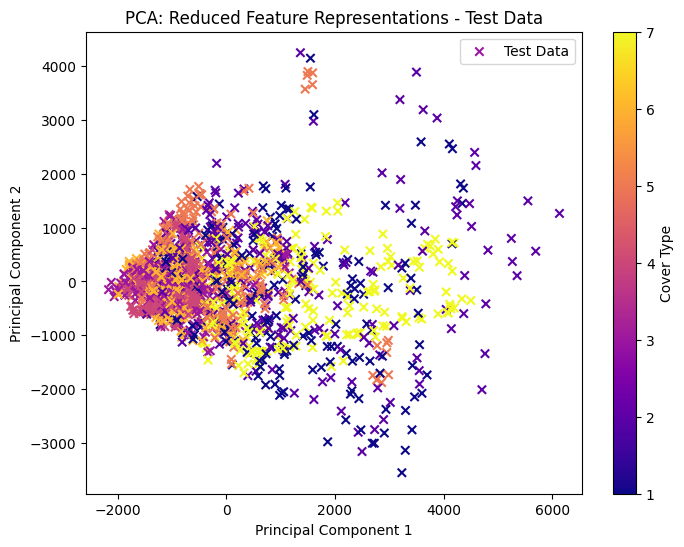

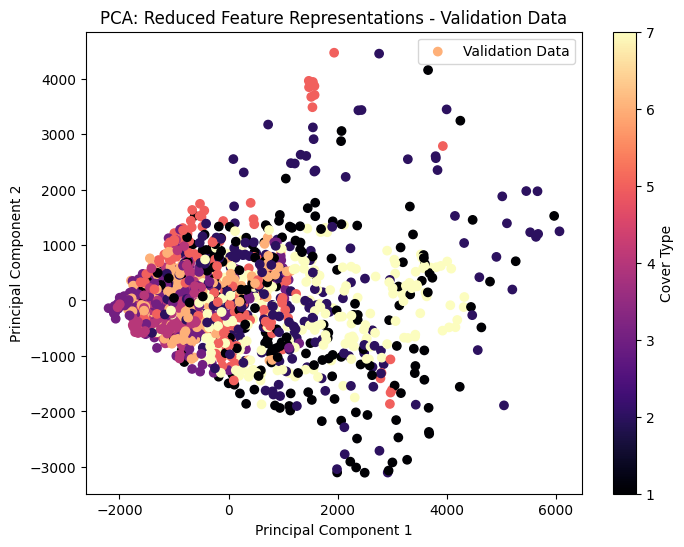

In [123]:
num_components = 10
pca = PCA(n_components=num_components)

# Fit PCA on the training data and transform the training set
X_train_pca = pca.fit_transform(X_train)

# Transform the validation set using the same PCA model
X_validation_pca = pca.transform(X_validation)

# Transform the test set using the same PCA model
X_test_pca = pca.transform(X_test)

# Create a scatter plot for the reduced feature representations of training data
plt.figure(figsize=(8, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', label='Training Data')
plt.colorbar(label='Cover Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Reduced Feature Representations - Training Data')
plt.legend()
plt.show()

# Create a scatter plot for the reduced feature representations of test data
plt.figure(figsize=(8, 6))
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, cmap='plasma', marker='x', label='Test Data')
plt.colorbar(label='Cover Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Reduced Feature Representations - Test Data')
plt.legend()
plt.show()

# Create a scatter plot for the reduced feature representations of validation data
plt.figure(figsize=(8, 6))
plt.scatter(X_validation_pca[:, 0], X_validation_pca[:, 1], c=y_validation, cmap='magma', marker='o', label='Validation Data')
plt.colorbar(label='Cover Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Reduced Feature Representations - Validation Data')
plt.legend()
plt.show()


Training Accuracy for KNN: 0.8853
Testing Accuracy for KNN: 0.7384
Validation Accuracy for KNN: 0.7523


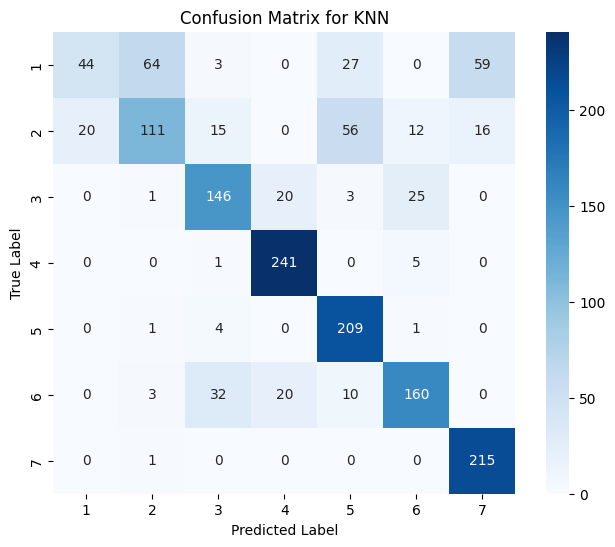

Training Accuracy for Decision Tree: 1.0000
Testing Accuracy for Decision Tree: 0.7016
Validation Accuracy for Decision Tree: 0.6896


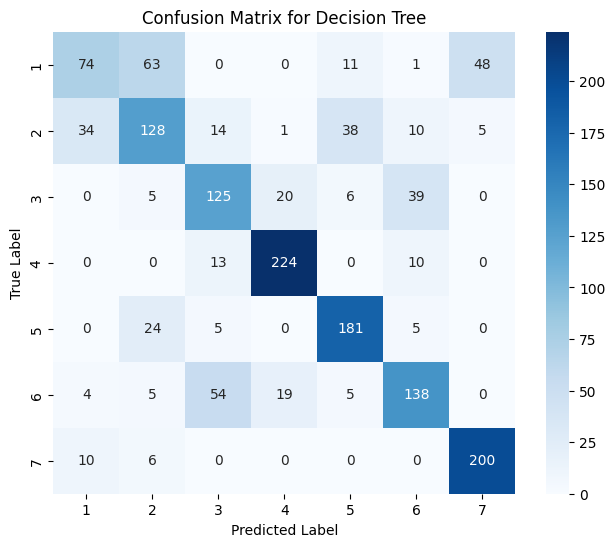

In [124]:
best_models={'KNN': KNeighborsClassifier(),'Decision Tree': DecisionTreeClassifier()}
baseline_resultss = {}
validation_results = {}

for model_name, model in best_models.items():
    test_accuracy, validation_accuracy = train_evaluate_model(model, model_name, X_train_pca, y_train, X_test_pca, y_test, X_validation_pca, y_validation)
    baseline_resultss[model_name] = test_accuracy
    validation_results[model_name] = validation_accuracy


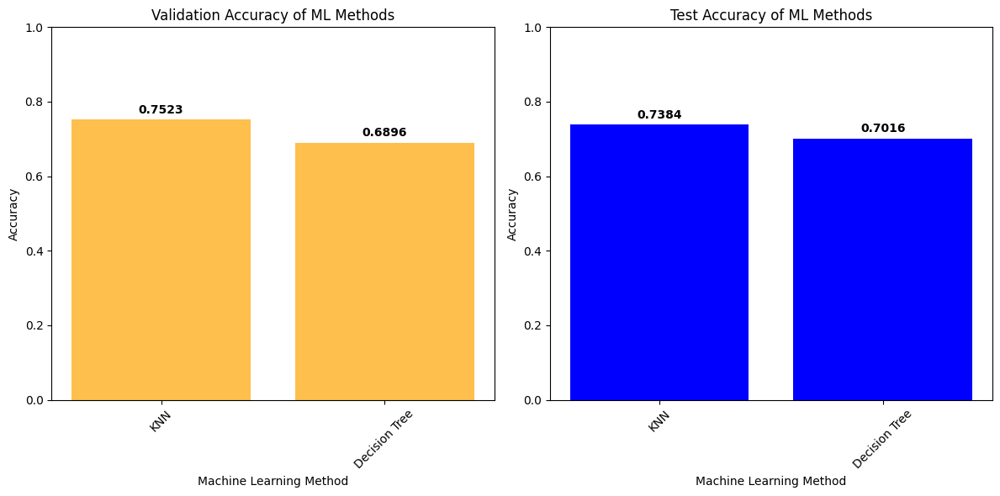

In [130]:
plt.figure(figsize=(12, 6))

# Plot for validation accuracy
plt.subplot(1, 2, 1)
bars_validation = plt.bar(validation_results.keys(), validation_results.values(), alpha=0.7, color='orange')
plt.title('Validation Accuracy of ML Methods')
plt.xlabel('Machine Learning Method')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.xticks(rotation=45)

# Show the validation accuracy values on top of the bars
for bar in bars_validation:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center', va='bottom', fontweight='bold')

# Plot for test accuracy
plt.subplot(1, 2, 2)
bars_test = plt.bar(baseline_resultss.keys(), baseline_resultss.values(), color='blue')
plt.title('Test Accuracy of ML Methods')
plt.xlabel('Machine Learning Method')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.xticks(rotation=45)

# Show the test accuracy values on top of the bars
for bar in bars_test:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()


Accuracy of KNN with 1 features: 0.5062295081967213
Accuracy of Decision Tree with 1 features: 0.519344262295082
Accuracy of KNN with 2 features: 0.5075409836065574
Accuracy of Decision Tree with 2 features: 0.520655737704918
Accuracy of KNN with 3 features: 0.5855737704918033
Accuracy of Decision Tree with 3 features: 0.5606557377049181
Accuracy of KNN with 4 features: 0.68
Accuracy of Decision Tree with 4 features: 0.6498360655737705
Accuracy of KNN with 5 features: 0.68
Accuracy of Decision Tree with 5 features: 0.6734426229508197
Accuracy of KNN with 6 features: 0.68
Accuracy of Decision Tree with 6 features: 0.7180327868852459
Accuracy of KNN with 7 features: 0.68
Accuracy of Decision Tree with 7 features: 0.718688524590164
Accuracy of KNN with 8 features: 0.68
Accuracy of Decision Tree with 8 features: 0.7245901639344262
Accuracy of KNN with 9 features: 0.68
Accuracy of Decision Tree with 9 features: 0.7062295081967213
Accuracy of KNN with 10 features: 0.68
Accuracy of Decision T

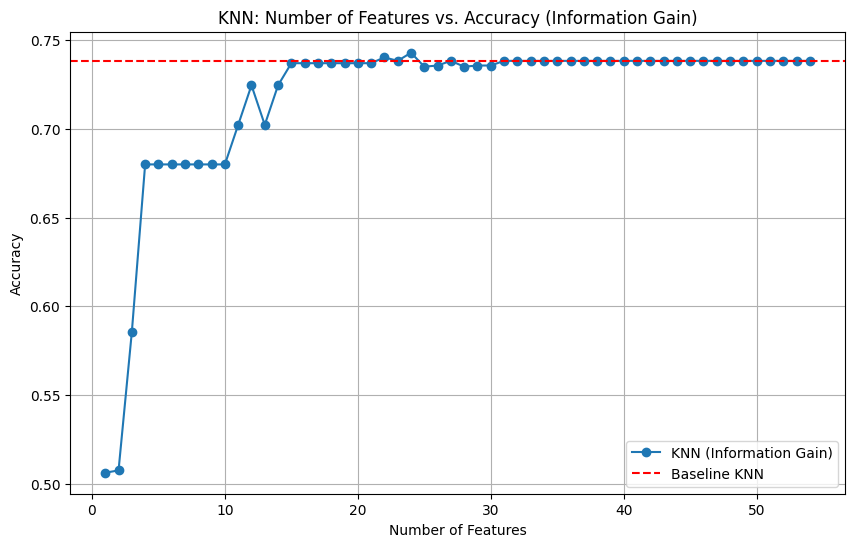

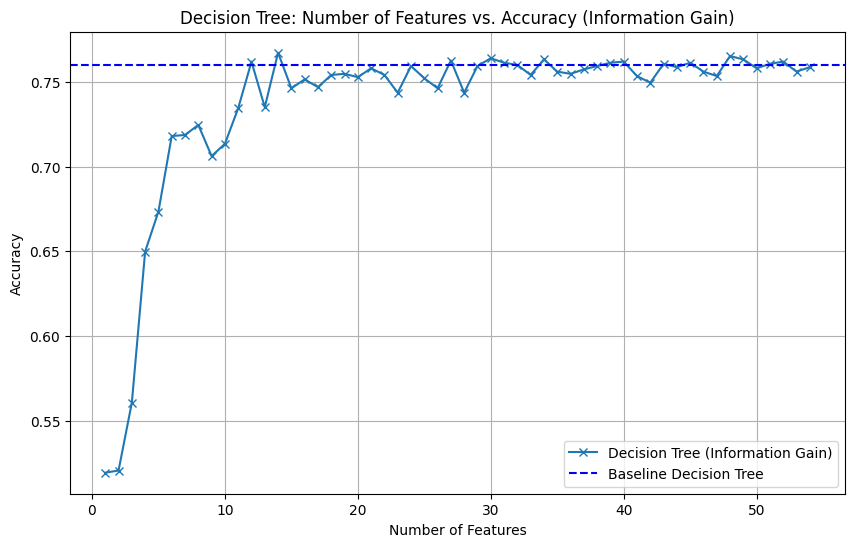

In [127]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

max_k = X_train.shape[1]  # The maximum value of k is the number of features in X_train
accuracy_knn_list = []  # To store the accuracy for KNN at each k
accuracy_dt_list = []   # To store the accuracy for Decision Tree at each k

# Baseline accuracies for KNN and Decision Tree without feature selection
baseline_knn = baseline_results['KNN']
baseline_dt = baseline_results['Decision Tree']

for k in range(1, max_k + 1):
    # Create the SelectKBest object with mutual_info_classif as the scoring function
    selector = SelectKBest(score_func=mutual_info_classif, k=k)

    # Fit and transform the training data using SelectKBest with Information Gain
    X_train_filtered = selector.fit_transform(X_train, y_train)
    X_test_filtered = selector.transform(X_test)

    # KNN
    knn_model = KNeighborsClassifier()  # Instantiate KNN model
    knn_model.fit(X_train_filtered, y_train)
    y_pred_knn = knn_model.predict(X_test_filtered)
    accuracy_knn = accuracy_score(y_test, y_pred_knn)  # Calculate the accuracy on the test set
    accuracy_knn_list.append(accuracy_knn)  # Store the accuracy for KNN at this k

    # Decision Tree
    dt_model = DecisionTreeClassifier()  # Instantiate Decision Tree model
    dt_model.fit(X_train_filtered, y_train)
    y_pred_dt = dt_model.predict(X_test_filtered)
    accuracy_dt = accuracy_score(y_test, y_pred_dt)  # Calculate the accuracy on the test set
    accuracy_dt_list.append(accuracy_dt)  # Store the accuracy for Decision Tree at this k

    print(f"Accuracy of KNN with {k} features:", accuracy_knn)
    print(f"Accuracy of Decision Tree with {k} features:", accuracy_dt)

# After the loop, you have the lists 'accuracy_knn_list' and 'accuracy_dt_list'
# containing the accuracy values for KNN and Decision Tree at each value of k.

# Now, you can plot the results for KNN.
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k + 1), accuracy_knn_list, label='KNN (Information Gain)', marker='o')
plt.axhline(y=baseline_knn, linestyle='--', color='red', label='Baseline KNN')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('KNN: Number of Features vs. Accuracy (Information Gain)')
plt.legend()
plt.grid(True)
plt.show()

# Plot the results for Decision Tree.
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k + 1), accuracy_dt_list, label='Decision Tree (Information Gain)', marker='x')
plt.axhline(y=baseline_dt, linestyle='--', color='blue', label='Baseline Decision Tree')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('Decision Tree: Number of Features vs. Accuracy (Information Gain)')
plt.legend()
plt.grid(True)
plt.show()

Accuracy of KNN with 1 features: 0.5062295081967213
Accuracy of Decision Tree with 1 features: 0.519344262295082
Accuracy of KNN with 2 features: 0.5855737704918033
Accuracy of Decision Tree with 2 features: 0.539672131147541
Accuracy of KNN with 3 features: 0.68
Accuracy of Decision Tree with 3 features: 0.6485245901639344
Accuracy of KNN with 4 features: 0.7095081967213115
Accuracy of Decision Tree with 4 features: 0.700327868852459
Accuracy of KNN with 5 features: 0.7245901639344262
Accuracy of Decision Tree with 5 features: 0.6957377049180328
Accuracy of KNN with 6 features: 0.7298360655737705
Accuracy of Decision Tree with 6 features: 0.7377049180327869
Accuracy of KNN with 7 features: 0.7298360655737705
Accuracy of Decision Tree with 7 features: 0.7357377049180328
Accuracy of KNN with 8 features: 0.7285245901639344
Accuracy of Decision Tree with 8 features: 0.72
Accuracy of KNN with 9 features: 0.7324590163934426
Accuracy of Decision Tree with 9 features: 0.719344262295082
Accura

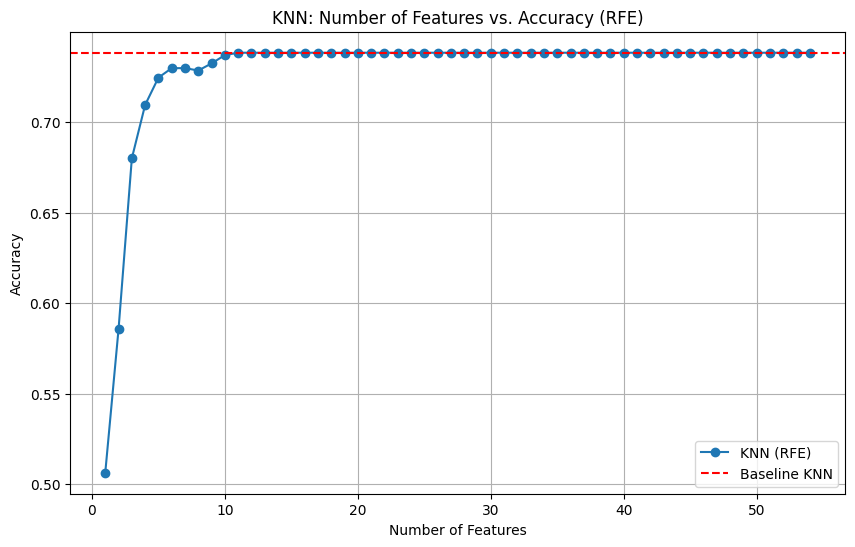

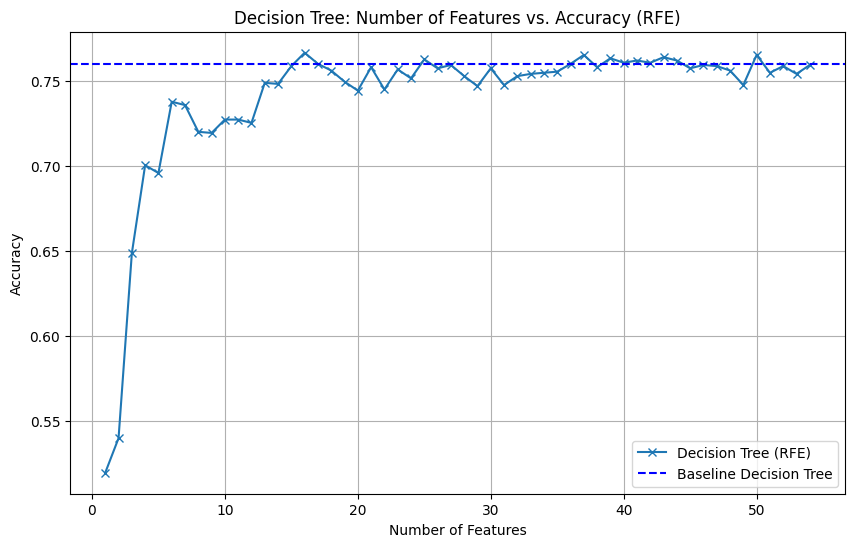

In [136]:
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Your X_train, X_test, y_train, and y_test should be defined here
rf = RandomForestClassifier()
max_k = X_train.shape[1]  # The maximum value of k is the number of features in X_train
accuracy_knn_list = []  # To store the accuracy for KNN at each k
accuracy_dt_list = []   # To store the accuracy for Decision Tree at each k

for k in range(1, max_k + 1):
    # Wrapper method: Recursive Feature Elimination (RFE) for KNN
    selector_knn = RFE(estimator=rf, n_features_to_select=k)
    selector_knn.fit(X_train, y_train)
    X_train_selected = selector_knn.transform(X_train)
    X_test_selected = selector_knn.transform(X_test)

    # KNN
    knn_model = KNeighborsClassifier()  # Instantiate KNN model
    knn_model.fit(X_train_selected, y_train)
    y_pred_knn = knn_model.predict(X_test_selected)
    accuracy_knn = accuracy_score(y_test, y_pred_knn)  # Calculate the accuracy on the test set
    accuracy_knn_list.append(accuracy_knn)  # Store the accuracy for KNN at this k

    # Wrapper method: Recursive Feature Elimination (RFE) for Decision Tree
    selector_dt = RFE(estimator=DecisionTreeClassifier(), n_features_to_select=k)
    selector_dt.fit(X_train, y_train)
    X_train_dt = selector_dt.transform(X_train)
    X_test_dt = selector_dt.transform(X_test)

    # Decision Tree
    dt_model = DecisionTreeClassifier()  # Instantiate Decision Tree model
    dt_model.fit(X_train_dt, y_train)
    y_pred_dt = dt_model.predict(X_test_dt)
    accuracy_dt = accuracy_score(y_test, y_pred_dt)  # Calculate the accuracy on the test set
    accuracy_dt_list.append(accuracy_dt)  # Store the accuracy for Decision Tree at this k

    print(f"Accuracy of KNN with {k} features:", accuracy_knn)
    print(f"Accuracy of Decision Tree with {k} features:", accuracy_dt)

# After the loop, you have the lists 'accuracy_knn_list' and 'accuracy_dt_list'
# containing the accuracy values for KNN and Decision Tree at each value of k.

# Now, you can plot the results for KNN.
num_features_range = range(1, max_k + 1)
plt.figure(figsize=(10, 6))
plt.plot(num_features_range, accuracy_knn_list, label='KNN (RFE)', marker='o')
plt.axhline(y=baseline_results['KNN'], linestyle='--', color='red', label='Baseline KNN')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('KNN: Number of Features vs. Accuracy (RFE)')
plt.legend()
plt.grid(True)
plt.show()

# Plot the results for Decision Tree.
plt.figure(figsize=(10, 6))
plt.plot(num_features_range, accuracy_dt_list, label='Decision Tree (RFE)', marker='x')
plt.axhline(y=baseline_results['Decision Tree'], linestyle='--', color='blue', label='Baseline Decision Tree')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('Decision Tree: Number of Features vs. Accuracy (RFE)')
plt.legend()
plt.grid(True)
plt.show()


In [137]:
# Calculate mean accuracy across all values of k for KNN and Decision Tree
mean_accuracy_knn = np.mean(accuracy_knn_list)
mean_accuracy_dt = np.mean(accuracy_dt_list)

print("Mean Accuracy of KNN (RFE):", mean_accuracy_knn)
print("Mean Accuracy of Decision Tree (RFE):", mean_accuracy_dt)

Mean Accuracy of KNN (RFE): 0.7287310261080756
Mean Accuracy of Decision Tree (RFE): 0.7401335761991499


In [139]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Set the seed for reproducibility
seed = 25
np.random.seed(seed)

# Instantiate the Random Forest model with the random_state parameter
rf_model = RandomForestClassifier(random_state=seed)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred_rf = rf_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_pred_rf)

# Print accuracy values
print(f'Testing Accuracy for Random Forest: {test_accuracy:.4f}')


Testing Accuracy for Random Forest: 0.8131


Testing Accuracy for Random Forest: 0.8131


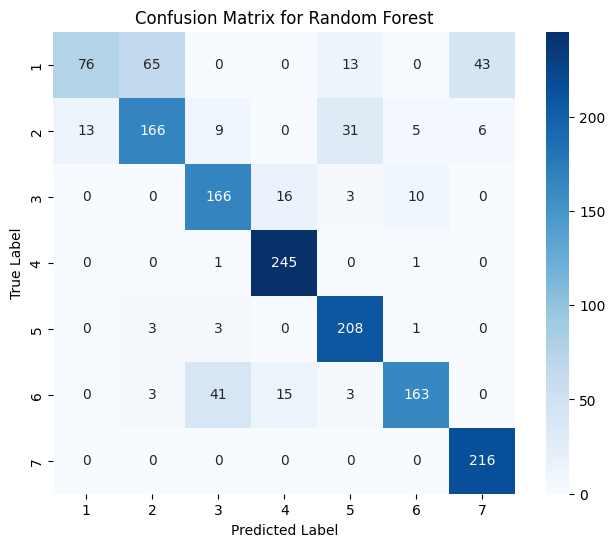

In [141]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set the seed for reproducibility
seed = 25
np.random.seed(seed)

# Instantiate the Random Forest model with the random_state parameter
rf_model = RandomForestClassifier(random_state=seed)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred_rf = rf_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_pred_rf)

# Print accuracy values
print(f'Testing Accuracy for Random Forest: {test_accuracy:.4f}')

# Plot confusion matrix using seaborn for the testing set
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=np.arange(1, 8), yticklabels=np.arange(1, 8))
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


###Q3

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy of Voting Ensemble: 0.8131147540983606
Accuracy of Boosting: 0.8144262295081968
Accuracy of Stacking: 0.820983606557377


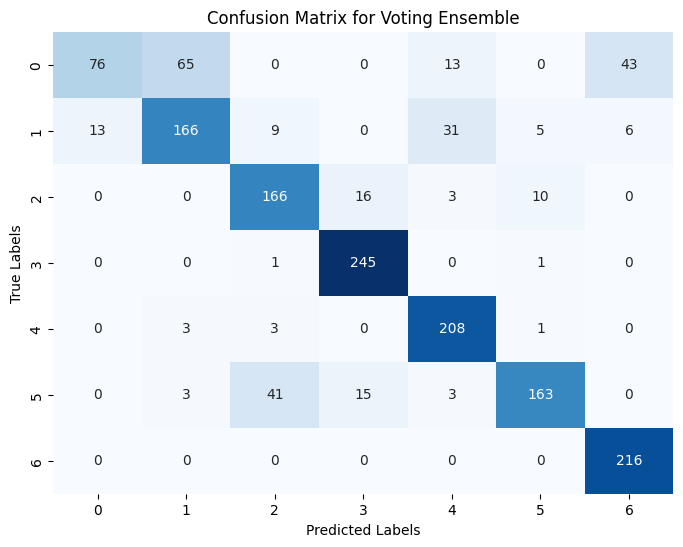

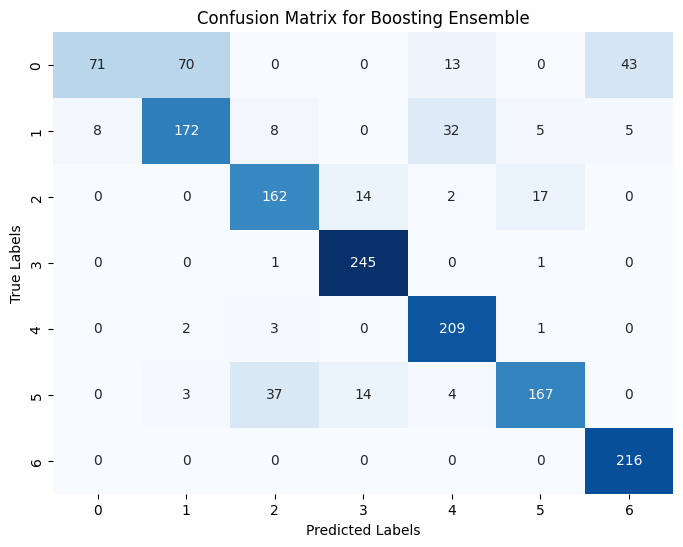

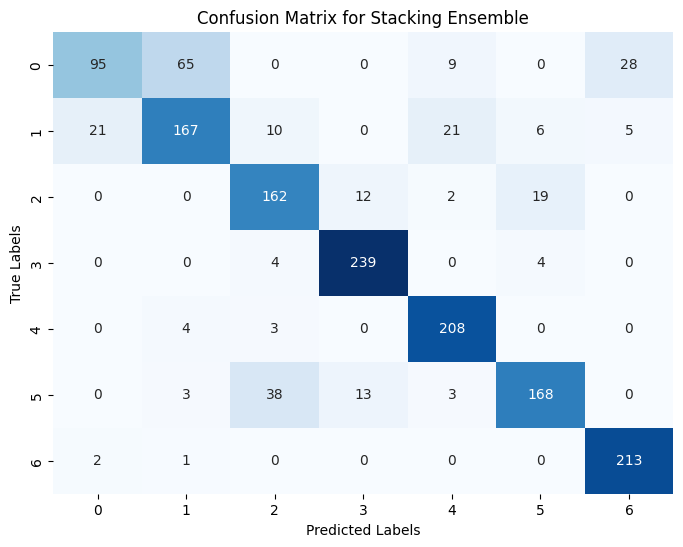

In [140]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np


# Base model for Stacking Ensemble
rf_model = RandomForestClassifier(random_state=25)

# Create Voting Ensemble with the base model
voting_model = VotingClassifier(estimators=[('rf', rf_model)], voting='hard')


# Create Boosting Ensemble with the base model
boosting_model = AdaBoostClassifier(base_estimator=rf_model, n_estimators=50)

# Create Stacking Ensemble with the base model and Voting as the final estimator
stacking_model = StackingClassifier(estimators=[('rf', rf_model)], final_estimator=voting_model)

# Fit and predict with Voting Ensemble
voting_model.fit(X_train, y_train)
y_pred_voting = voting_model.predict(X_test)
accuracy_voting = accuracy_score(y_test, y_pred_voting)



# Fit and predict with Boosting Ensemble
boosting_model.fit(X_train, y_train)
y_pred_boosting = boosting_model.predict(X_test)
accuracy_boosting = accuracy_score(y_test, y_pred_boosting)

# Fit and predict with Stacking Ensemble
stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)
accuracy_stacking = accuracy_score(y_test, y_pred_stacking)

print("Accuracy of Voting Ensemble:", accuracy_voting)
print("Accuracy of Boosting:", accuracy_boosting)
print("Accuracy of Stacking:", accuracy_stacking)


# Calculate confusion matrix for Voting Ensemble
cm_Voting = confusion_matrix(y_test, y_pred_voting)

# Calculate confusion matrix for Boosting Ensemble
cm_boosting = confusion_matrix(y_test, y_pred_boosting)

# Calculate confusion matrix for Stacking Ensemble
cm_stacking = confusion_matrix(y_test, y_pred_stacking)

# Plot confusion matrix for Voting Ensemble
plt.figure(figsize=(8, 6))
sns.heatmap(cm_Voting, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix for Voting Ensemble")
plt.show()


# Plot confusion matrix for Boosting Ensemble
plt.figure(figsize=(8, 6))
sns.heatmap(cm_boosting, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix for Boosting Ensemble")
plt.show()

# Plot confusion matrix for Stacking Ensemble
plt.figure(figsize=(8, 6))
sns.heatmap(cm_stacking, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix for Stacking Ensemble")
plt.show()

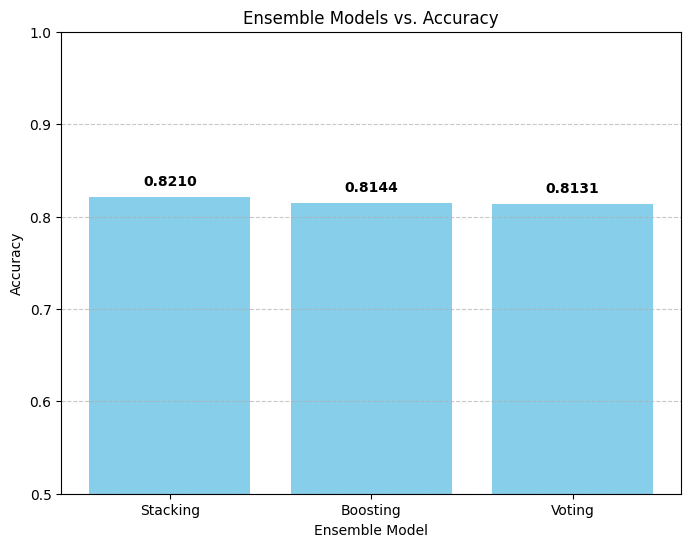

In [142]:
# Calculate accuracies for each ensemble
accuracies = [accuracy_stacking, accuracy_boosting, accuracy_voting]
ensemble_labels = ['Stacking', 'Boosting', 'Voting']

# Plot the accuracies
plt.figure(figsize=(8, 6))
plt.bar(ensemble_labels, accuracies, color='skyblue')

# Show the accuracy values on top of the bars
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.01, f'{acc:.4f}', ha='center', va='bottom', fontweight='bold')

plt.xlabel('Ensemble Model')
plt.ylabel('Accuracy')
plt.title('Ensemble Models vs. Accuracy')
plt.ylim(0.5, 1.0)  # Set y-axis limit for better visualization
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Epoch 1/10
208/208 [==============================] - 3s 10ms/step - loss: 1.2388 - accuracy: 0.5736 - val_loss: 4.1265 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 2s 8ms/step - loss: 0.7750 - accuracy: 0.7704 - val_loss: 2.6832 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 2s 9ms/step - loss: 0.6420 - accuracy: 0.8122 - val_loss: 1.6374 - val_accuracy: 0.0495
Epoch 4/10
208/208 [==============================] - 2s 8ms/step - loss: 0.6069 - accuracy: 0.8196 - val_loss: 1.9676 - val_accuracy: 0.0066
Epoch 5/10
208/208 [==============================] - 2s 7ms/step - loss: 0.5578 - accuracy: 0.8342 - val_loss: 1.3057 - val_accuracy: 0.0078
Epoch 6/10
208/208 [==============================] - 2s 11ms/step - loss: 0.5331 - accuracy: 0.8396 - val_loss: 0.9649 - val_accuracy: 0.7913
Epoch 7/10
208/208 [==============================] - 2s 11ms/step - loss: 0.5352 - accuracy: 0.8383 - val_loss: 1.3168 - val_accuracy: 0.

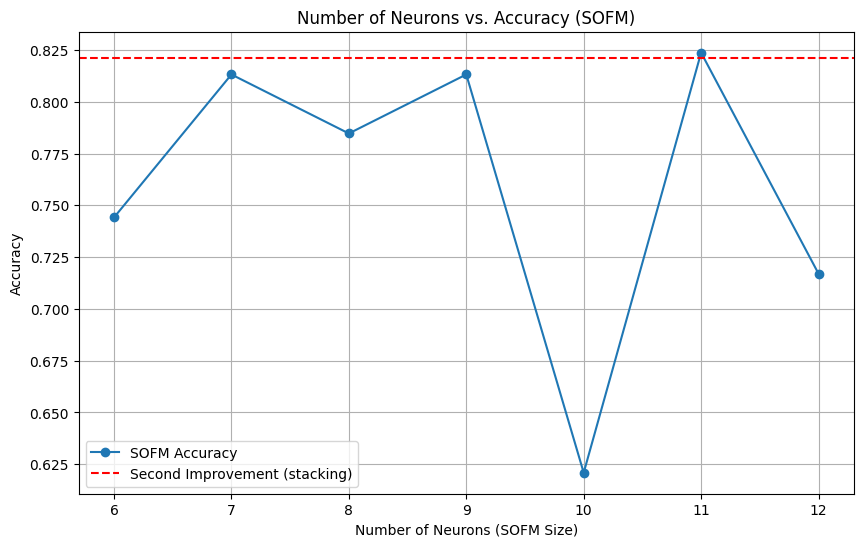

In [143]:


grid_structures = [6, 7, 8, 9, 10, 11, 12]

clusters_list = []

for grid_size in grid_structures:
    som = MiniSom(grid_size, grid_size, X_train.shape[1], sigma=0.3, learning_rate=0.5, random_seed=42)
    som.random_weights_init(X_train.values)
    num_epochs = 1000
    som.train_batch(X_train.values, num_epochs)
    clusters_train = np.array([som.winner(x) for x in X_train.values])
    clusters_list.append(clusters_train)

scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train)

rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf_model.fit(X_train_scaled, y_train)

rf_predictions_train = rf_model.predict(X_train_scaled)

num_classes = len(np.unique(y_train)) + 1
y_train_encoded = to_categorical(y_train, num_classes=num_classes)

accuracy_list = {}

def create_model(input_shape, num_classes):
    model = Sequential()
    model.add(Dense(30, activation='tanh', input_shape=(input_shape,)))
    model.add(Dense(30, activation='tanh'))
    model.add(Dense(30, activation='tanh'))
    model.add(Dense(30, activation='tanh'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

learning_rate = 0.001

for grid_size, clusters_train in zip(grid_structures, clusters_list):
    # Concatenate rf_predictions_train and clusters_train
    rf_sofm = np.repeat(rf_predictions_train.reshape(-1, 1), grid_size * grid_size, axis=1)
    X_combined = np.hstack((X_train_scaled, rf_sofm, clusters_train))

    model = create_model(input_shape=X_combined.shape[1], num_classes=num_classes)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_combined, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)

    # Evaluate the accuracy on the validation set
    _, accuracy = model.evaluate(X_combined, y_train_encoded)

    # Store the accuracy for the corresponding SOFM size
    accuracy_list[grid_size] = accuracy

# Plot the number of neurons vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(list(accuracy_list.keys()), list(accuracy_list.values()), label='SOFM Accuracy', marker='o')
plt.axhline(y=accuracy_stacking, linestyle='--', color='red', label='Second Improvement (stacking)')
plt.xlabel('Number of Neurons (SOFM Size)')
plt.ylabel('Accuracy')
plt.title('Number of Neurons vs. Accuracy (SOFM)')
plt.legend()
plt.grid(True)
plt.show()


Epoch 1/10
39/39 [==============================] - 2s 24ms/step - loss: 1.8016 - accuracy: 0.3369 - val_loss: 1.5075 - val_accuracy: 0.5508
Epoch 2/10
39/39 [==============================] - 0s 12ms/step - loss: 1.3031 - accuracy: 0.6074 - val_loss: 1.0613 - val_accuracy: 0.6984
Epoch 3/10
39/39 [==============================] - 0s 7ms/step - loss: 0.9699 - accuracy: 0.7689 - val_loss: 0.8066 - val_accuracy: 0.7836
Epoch 4/10
39/39 [==============================] - 0s 9ms/step - loss: 0.7464 - accuracy: 0.8402 - val_loss: 0.6538 - val_accuracy: 0.8459
Epoch 5/10
39/39 [==============================] - 0s 8ms/step - loss: 0.5792 - accuracy: 0.8836 - val_loss: 0.5396 - val_accuracy: 0.8885
Epoch 6/10
39/39 [==============================] - 0s 9ms/step - loss: 0.5056 - accuracy: 0.8918 - val_loss: 0.4582 - val_accuracy: 0.9082
Epoch 7/10
39/39 [==============================] - 0s 12ms/step - loss: 0.4437 - accuracy: 0.9008 - val_loss: 0.5113 - val_accuracy: 0.8426
Epoch 8/10
39/39 

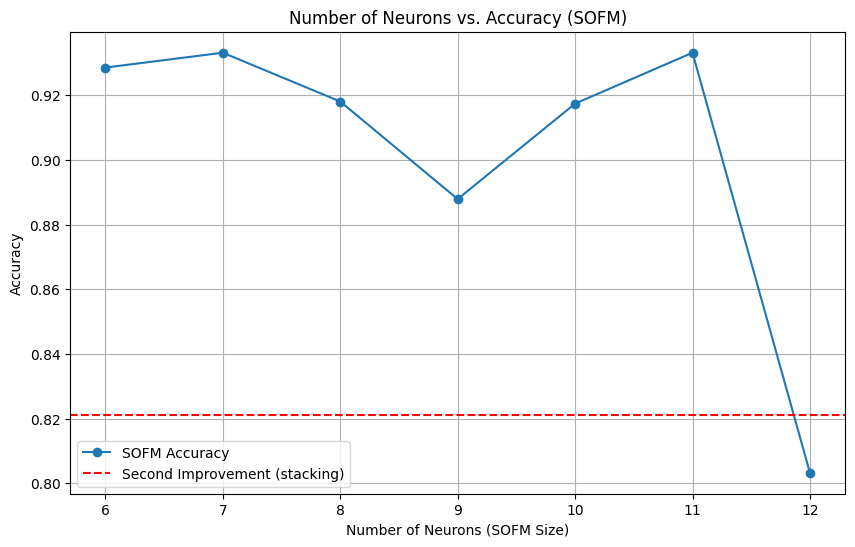

In [148]:
grid_structures = [6, 7, 8, 9, 10, 11, 12]

clusters_list = []

for grid_size in grid_structures:
    som = MiniSom(grid_size, grid_size, X_test.shape[1], sigma=0.3, learning_rate=0.5, random_seed=42)
    som.random_weights_init(X_test.values)
    num_epochs = 1000
    som.train_batch(X_test.values, num_epochs)
    clusters_test = np.array([som.winner(x) for x in X_test.values])
    clusters_list.append(clusters_test)

scaler = MinMaxScaler()

X_test_scaled = scaler.fit_transform(X_test)

rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf_model.fit(X_test_scaled, y_test)

rf_predictions_test = rf_model.predict(X_test_scaled)

num_classes = len(np.unique(y_test)) + 1
y_test_encoded = to_categorical(y_test, num_classes=num_classes)

accuracy_list = {}

for grid_size, clusters_test in zip(grid_structures, clusters_list):
    # Concatenate rf_predictions_test and clusters_test
    rf_sofm = np.repeat(rf_predictions_test.reshape(-1, 1), grid_size * grid_size, axis=1)
    X_combined = np.hstack((X_test_scaled, rf_sofm, clusters_test))

    model = create_model(input_shape=X_combined.shape[1], num_classes=num_classes)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_combined, y_test_encoded, epochs=10, batch_size=32, validation_split=0.2)

    # Evaluate the accuracy on the validation set
    _, accuracy = model.evaluate(X_combined, y_test_encoded)

    # Store the accuracy for the corresponding SOFM size
    accuracy_list[grid_size] = accuracy

# Plot the number of neurons vs. accuracy
plt.figure(figsize=(10, 6))
plt.plot(list(accuracy_list.keys()), list(accuracy_list.values()), label='SOFM Accuracy', marker='o')
plt.axhline(y=accuracy_stacking, linestyle='--', color='red', label='Second Improvement (stacking)')
plt.xlabel('Number of Neurons (SOFM Size)')
plt.ylabel('Accuracy')
plt.title('Number of Neurons vs. Accuracy (SOFM)')
plt.legend()
plt.grid(True)
plt.show()

Epoch 1/10
208/208 [==============================] - 2s 5ms/step - loss: 1.2085 - accuracy: 0.6003 - val_loss: 3.9753 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 1s 6ms/step - loss: 0.7538 - accuracy: 0.7761 - val_loss: 2.9497 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 1s 6ms/step - loss: 0.6633 - accuracy: 0.7936 - val_loss: 2.1135 - val_accuracy: 0.0000e+00
Epoch 4/10
208/208 [==============================] - 1s 6ms/step - loss: 0.5932 - accuracy: 0.8196 - val_loss: 1.7935 - val_accuracy: 0.0000e+00
Epoch 5/10
208/208 [==============================] - 1s 3ms/step - loss: 0.5682 - accuracy: 0.8289 - val_loss: 1.3852 - val_accuracy: 0.0000e+00
Epoch 6/10
208/208 [==============================] - 1s 4ms/step - loss: 0.5464 - accuracy: 0.8328 - val_loss: 1.5564 - val_accuracy: 0.0000e+00
Epoch 7/10
208/208 [==============================] - 1s 4ms/step - loss: 0.5446 - accuracy: 0.8327 - val_loss: 1.2585 - val

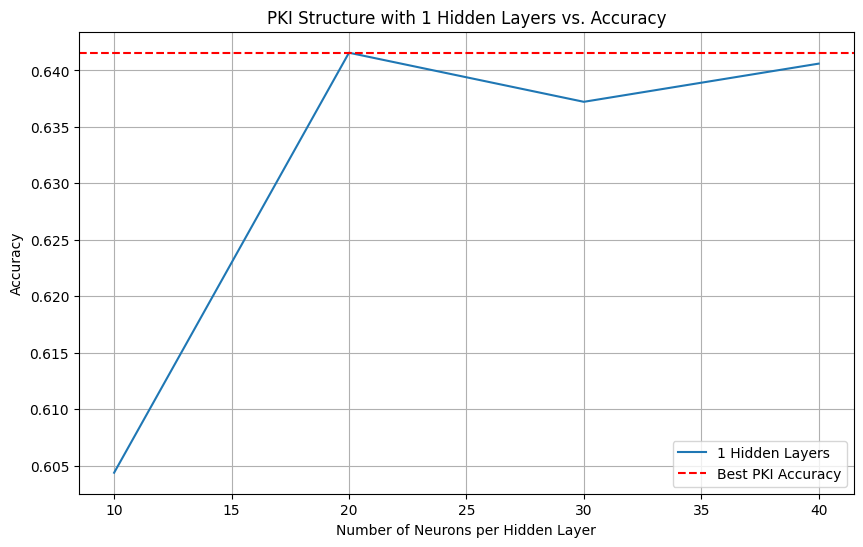

Epoch 1/10
208/208 [==============================] - 1s 4ms/step - loss: 1.7493 - accuracy: 0.3355 - val_loss: 3.7585 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 1s 3ms/step - loss: 1.3482 - accuracy: 0.5922 - val_loss: 3.7107 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 1s 3ms/step - loss: 1.0305 - accuracy: 0.7044 - val_loss: 4.0898 - val_accuracy: 0.0000e+00
Epoch 4/10
208/208 [==============================] - 1s 3ms/step - loss: 0.8983 - accuracy: 0.7358 - val_loss: 3.5195 - val_accuracy: 0.0000e+00
Epoch 5/10
208/208 [==============================] - 1s 3ms/step - loss: 0.8312 - accuracy: 0.7500 - val_loss: 4.1794 - val_accuracy: 0.0000e+00
Epoch 6/10
208/208 [==============================] - 1s 3ms/step - loss: 0.7719 - accuracy: 0.7737 - val_loss: 2.8308 - val_accuracy: 0.0000e+00
Epoch 7/10
208/208 [==============================] - 1s 4ms/step - loss: 0.7556 - accuracy: 0.7740 - val_loss: 3.0787 - val

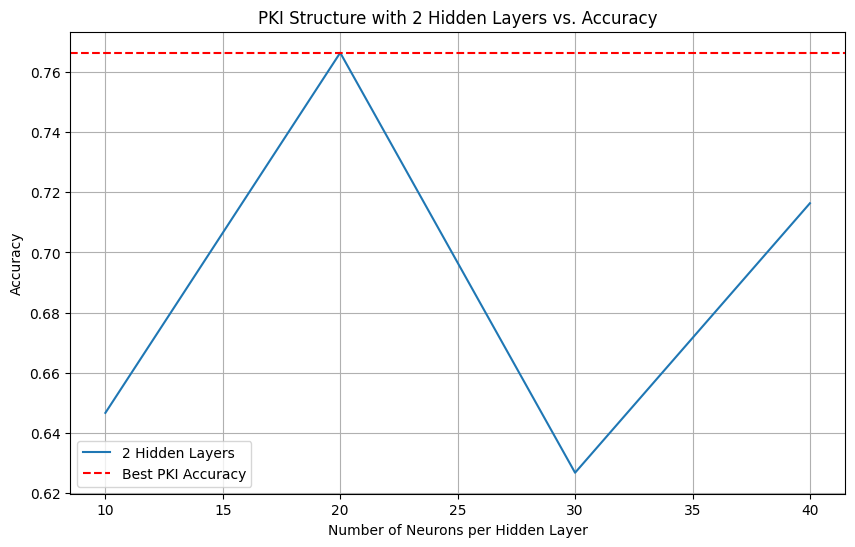

Epoch 1/10
208/208 [==============================] - 1s 4ms/step - loss: 1.6662 - accuracy: 0.3479 - val_loss: 4.3808 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 1s 3ms/step - loss: 1.4105 - accuracy: 0.5489 - val_loss: 4.4986 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 1s 3ms/step - loss: 1.1717 - accuracy: 0.6673 - val_loss: 4.5410 - val_accuracy: 0.0000e+00
Epoch 4/10
208/208 [==============================] - 1s 3ms/step - loss: 0.9598 - accuracy: 0.7044 - val_loss: 4.4529 - val_accuracy: 0.0000e+00
Epoch 5/10
208/208 [==============================] - 1s 4ms/step - loss: 0.8505 - accuracy: 0.7438 - val_loss: 4.1440 - val_accuracy: 0.0000e+00
Epoch 6/10
208/208 [==============================] - 1s 5ms/step - loss: 0.7850 - accuracy: 0.7692 - val_loss: 3.9480 - val_accuracy: 0.0000e+00
Epoch 7/10
208/208 [==============================] - 1s 5ms/step - loss: 0.7679 - accuracy: 0.7729 - val_loss: 4.0598 - val

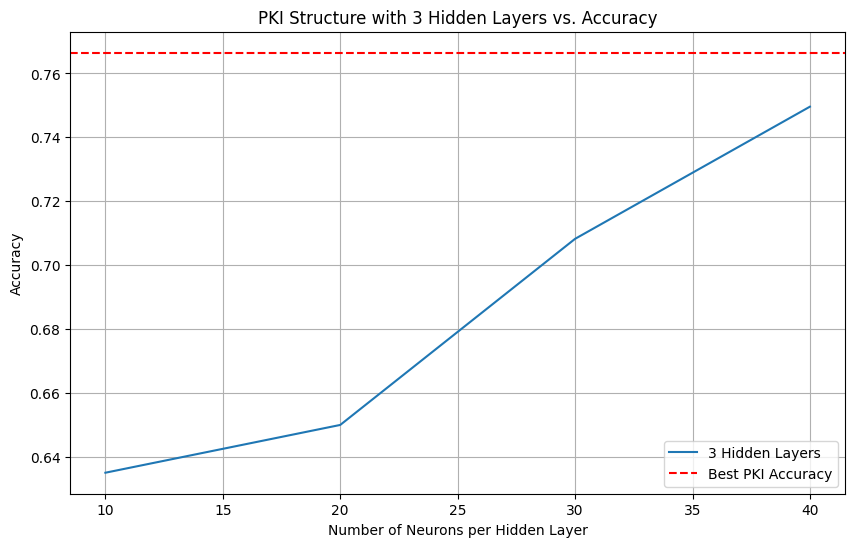

Epoch 1/10
208/208 [==============================] - 1s 4ms/step - loss: 1.6870 - accuracy: 0.3460 - val_loss: 4.7833 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 1s 4ms/step - loss: 1.4051 - accuracy: 0.5438 - val_loss: 4.3622 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 1s 4ms/step - loss: 1.1911 - accuracy: 0.6652 - val_loss: 3.4751 - val_accuracy: 0.0000e+00
Epoch 4/10
208/208 [==============================] - 1s 6ms/step - loss: 0.9343 - accuracy: 0.7333 - val_loss: 3.9713 - val_accuracy: 0.0000e+00
Epoch 5/10
208/208 [==============================] - 1s 6ms/step - loss: 0.8355 - accuracy: 0.7609 - val_loss: 2.6536 - val_accuracy: 0.0000e+00
Epoch 6/10
208/208 [==============================] - 1s 6ms/step - loss: 0.7369 - accuracy: 0.8001 - val_loss: 2.4177 - val_accuracy: 0.0000e+00
Epoch 7/10
208/208 [==============================] - 1s 4ms/step - loss: 0.6939 - accuracy: 0.8094 - val_loss: 2.2486 - val

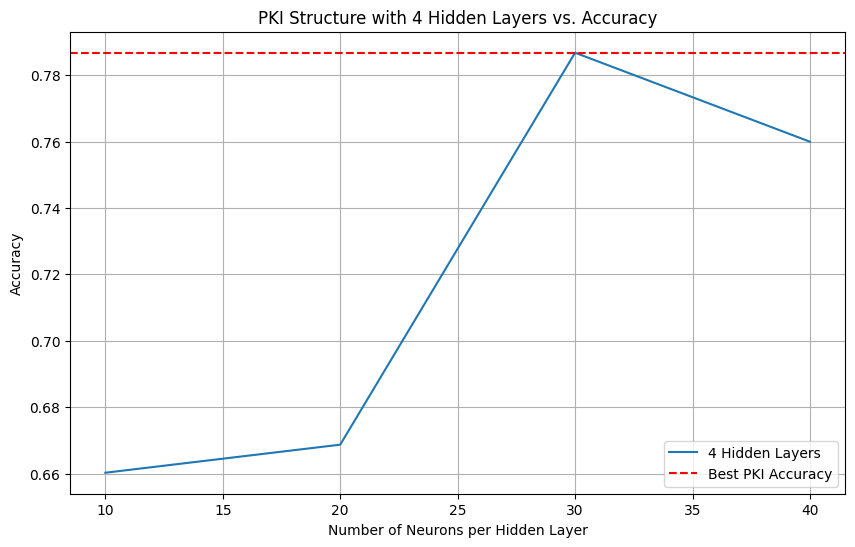

Epoch 1/10
208/208 [==============================] - 2s 5ms/step - loss: 1.6387 - accuracy: 0.4128 - val_loss: 3.7275 - val_accuracy: 0.0000e+00
Epoch 2/10
208/208 [==============================] - 1s 4ms/step - loss: 1.1914 - accuracy: 0.6313 - val_loss: 3.2208 - val_accuracy: 0.0000e+00
Epoch 3/10
208/208 [==============================] - 1s 4ms/step - loss: 0.9788 - accuracy: 0.6874 - val_loss: 3.4447 - val_accuracy: 0.0000e+00
Epoch 4/10
208/208 [==============================] - 1s 4ms/step - loss: 0.9189 - accuracy: 0.6979 - val_loss: 3.2724 - val_accuracy: 0.0000e+00
Epoch 5/10
208/208 [==============================] - 1s 4ms/step - loss: 0.8301 - accuracy: 0.7330 - val_loss: 3.2090 - val_accuracy: 0.0000e+00
Epoch 6/10
208/208 [==============================] - 1s 4ms/step - loss: 0.7836 - accuracy: 0.7533 - val_loss: 3.4915 - val_accuracy: 0.0000e+00
Epoch 7/10
208/208 [==============================] - 1s 4ms/step - loss: 0.7749 - accuracy: 0.7491 - val_loss: 3.6549 - val

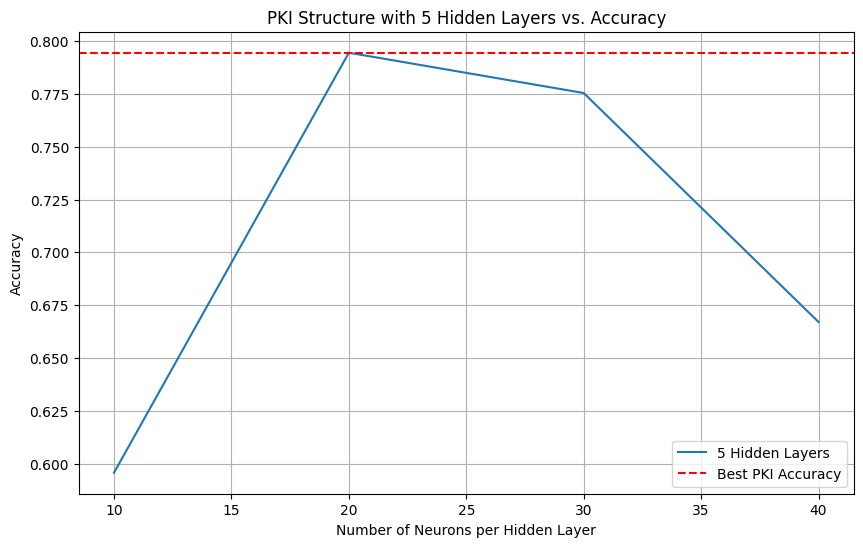

Best SOFM Structure: 7x7, Accuracy: 0.8297
Best PKI Structure: 5 Hidden Layers, 20 Neurons per Layer, Accuracy: 0.7945


In [149]:
import numpy as np
import pandas as pd
from minisom import MiniSom
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from keras.utils import to_categorical
import matplotlib.pyplot as plt

grid_structures = [6, 7, 8, 9, 10, 11, 12]

# Perform SOFM and find the best SOFM structure
best_sofm_structure = None
best_sofm_accuracy = 0.0

for grid_size in grid_structures:
    som = MiniSom(grid_size, grid_size, X_train.shape[1], sigma=0.3, learning_rate=0.5, random_seed=42)
    som.random_weights_init(X_train.values)
    num_epochs = 1000
    som.train_batch(X_train.values, num_epochs)
    clusters_train = np.array([som.winner(x) for x in X_train.values])

    # Concatenate rf_predictions_train and clusters_train
    rf_sofm = np.repeat(rf_predictions_train.reshape(-1, 1), grid_size * grid_size, axis=1)
    X_combined = np.hstack((X_train_scaled, rf_sofm, clusters_train))

    # Evaluate the accuracy on the validation set
    model = create_model(input_shape=X_combined.shape[1], num_classes=num_classes)
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_combined, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)
    _, accuracy = model.evaluate(X_combined, y_train_encoded)

    if accuracy > best_sofm_accuracy:
        best_sofm_accuracy = accuracy
        best_sofm_structure = grid_size

# Now, perform hyperparameter search for the PKI structure (Deep Neural Network)
best_pki_accuracy = 0.0
best_pki_structure = None

# Define different configurations to try for the PKI structure
hidden_layers_list = [1, 2, 3, 4, 5]
neurons_per_layer_list = [10, 20, 30, 40]

for hidden_layers in hidden_layers_list:
    accuracy_list_neurons = []
    for neurons_per_layer in neurons_per_layer_list:
        model = Sequential()
        model.add(Dense(neurons_per_layer, activation='tanh', input_shape=(X_combined.shape[1],)))
        for _ in range(hidden_layers - 1):
            model.add(Dense(neurons_per_layer, activation='tanh'))
        model.add(Dense(num_classes, activation='softmax'))

        optimizer = Adam(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
        model.fit(X_combined, y_train_encoded, epochs=10, batch_size=32, validation_split=0.2)
        _, accuracy = model.evaluate(X_combined, y_train_encoded)

        accuracy_list_neurons.append(accuracy)

        if accuracy > best_pki_accuracy:
            best_pki_accuracy = accuracy
            best_pki_structure = (hidden_layers, neurons_per_layer)

    # Plot the tuning performance for each number of hidden layer
    plt.figure(figsize=(10, 6))
    plt.plot(neurons_per_layer_list, accuracy_list_neurons, label=f'{hidden_layers} Hidden Layers')
    plt.axhline(y=best_pki_accuracy, linestyle='--', color='red', label='Best PKI Accuracy')
    plt.xlabel('Number of Neurons per Hidden Layer')
    plt.ylabel('Accuracy')
    plt.title(f'PKI Structure with {hidden_layers} Hidden Layers vs. Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

print(f"Best SOFM Structure: {best_sofm_structure}x{best_sofm_structure}, Accuracy: {best_sofm_accuracy:.4f}")
print(f"Best PKI Structure: {best_pki_structure[0]} Hidden Layers, {best_pki_structure[1]} Neurons per Layer, Accuracy: {best_pki_accuracy:.4f}")
